# Machine learninng model based on Blood biomarker profile for Alzheimer's disease diagnosis

In this practical work, a machine learning model has been developed for Alzheimer's disease diagnosis using blood biomarker profile reported in Alzheimer's disease neuroimaging intiative (ADNI) study. The steps will include inspect and clean data; filter, pre-process, analyse, and select significant feature that will be used in machine learning model development through training and testing, performance evaluation.

By nmupadhyay (10809512) EmaIL: nikhil.upadhyay@postgrad.plymouth.ac.uk

September 14, 2023

# Introduction

Machine learning has started transforming healthcare by anticipation of diseases through the analysis of extensive and intricate datasets. Alzheimer's disease, a progressive brain disorder has been facing the diagnosis crisis due to limitations of current diagnostic methods. With the new wealth of ML-derived intelligence, physicians, administrators can make timely, informed decisions about patient care and operational programmes that affect millions of lives. 

# Aims and Objectives

The main aim of this research work is to develop machine learning model for diagnosis of Alzheimer’s disease based on analysis of blood -based biochemical profile.

Objective:

1. Primary Objective is to build the machine learning model and investigate the accuracy of models for diagnosis of Alzheimer’s disease.

2. Secondary Objective is to perform a systematic review on understanding the relevant biomarkers and explore the potential usage in Alzheimer’s disease prediction.

# Step -1. Data Loading


### I. Import required libraries: 


In [ ]:
##################################################################################################################
# Import libraries that we need
import numpy as np  # library to support large multi-dimensional arrays and matrices and functions     
import pandas as pd    # for data manipulation and analysis
import seaborn as sns    # plotting library
import matplotlib.pyplot as plt # plotting library
import itertools
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score


### II. Load dataset:

In [2]:
##################################################################################################################
# Load dataset
df=pd.read_csv('./Blood biomarker baseline data_ADNI.csv', low_memory=False)

In [3]:
df

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,APOGEE,...,Unnamed: 1286,Unnamed: 1287,Purines Data from file: ADMCBarcelonapurine,Unnamed: 1289,Unnamed: 1290,Unnamed: 1291,Unnamed: 1292,Unnamed: 1293,Unnamed: 1294,Unnamed: 1295
0,RID at enrollment (Participant roster ID),Age\n(year),Gender,Education,Ethnicity\ncategory,Race subcategory,Married\nstatus,APOE4 genotype result,Diagnosis,L1CAM,...,TUDCA (Tauroursodeoxycholic acid),UDCA (Ursodeoxycholic acid),L.Glutamine,Taurine,Glycine,Inosine,Hypoxanthine,Xanthine,Xanthosine,Uric.acid
1,2,74.3,Male,16,Not Hisp/Latino,White,Married,0,CN,NaN,...,0.002,NaN,530.6025076,35.49789484,712.2334028,1.862880977,1.325800862,1.056745023,0.026759951,575.5513377
2,3,81.3,Male,18,Not Hisp/Latino,White,Married,1,AD,0.73,...,0.005,0.022,294.8877939,35.25381503,319.9505901,1.454096432,0.319595089,0.27669801,0.018367534,545.5947563
3,4,67.5,Male,10,Hisp/Latino,White,Married,0,LMCI,NaN,...,0.009,0.03,355.4172375,68.622106,419.9529924,1.703996497,0.697515115,0.619385988,0.027019954,437.5850613
4,5,73.7,Male,16,Not Hisp/Latino,White,Married,0,CN,NaN,...,0.024,0.06,435.975704,33.97121364,571.4948962,2.248941525,0.472482963,0.437379376,0.019958088,391.4946461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
815,1425,75.6,Female,16,Not Hisp/Latino,White,Divorced,0,LMCI,NaN,...,0.041,0.11,391.2407122,57.181786,219.9299462,0.877569358,0.588239296,0.57269758,0.017946284,333.511545
816,1426,83.4,Male,18,Not Hisp/Latino,White,Married,0,LMCI,NaN,...,0.002,NaN,390.0111459,51.61592622,421.9828354,1.9877263,0.712408447,0.628084323,0.018400625,595.1225739
817,1427,69.6,Female,12,Not Hisp/Latino,White,Widowed,0,LMCI,NaN,...,0.009,0.079,344.7856684,30.79902792,338.6360781,0.537731618,0.432963847,0.759096439,0.020839143,511.0697733
818,1430,83.4,Female,12,Not Hisp/Latino,White,Widowed,1,AD,NaN,...,NaN,NaN,347.4900263,33.37819626,890.0852335,0.047978223,0.370343059,0.776571199,0.031659994,424.7621937


In [4]:
# Make second row as the header as 1st row has name of combined columns instead of individual column name. 
df.columns = df.iloc[0]

# Drop the second row (which is now the column headers)
df = df[1:]
# Reset the index if needed
df = df.reset_index().drop(columns=['index'])

### III. Inspect dataset

In [5]:
##################################################################################################################

# Inspect dataset
# Inspect: number of samples and features
# Inspect: number of samples and number of samples
print(str("The dataset has ") + str(df.shape[0]) + str(' samples / instances & ')+str(df.shape[1])+ str(' features'))

The dataset has 819 samples / instances & 1296 features


# Step -2. Data pre-processing


In [6]:
# Data Processing
# Copy dataset
df_dropped = df.copy()

## 1.Cleaning the data:

### I. Checking & Handling of Missing values (Dropping columns depending on percentage missingness):

In [7]:
total_num_samples = df.shape[0]
num_missing = df.isnull().sum()
perct_missing=(num_missing/total_num_samples)*100


# Create a dataFrame of percentage missingness:
perc_missing = pd.DataFrame({
    'Column': perct_missing.index,  # Index of num_missing holds column names
    'perct_missing': perct_missing.values
})

print(perc_missing)

                                         Column  perct_missing
0     RID at enrollment (Participant roster ID)       0.000000
1                                   Age\n(year)       0.000000
2                                        Gender       0.000000
3                                     Education       0.000000
4                           Ethnicity\ncategory       0.000000
...                                         ...            ...
1291                                    Inosine       1.343101
1292                               Hypoxanthine       1.343101
1293                                   Xanthine       1.343101
1294                                 Xanthosine       1.343101
1295                                  Uric.acid       1.343101

[1296 rows x 2 columns]


In [14]:
missing_above_30_percent = perc_missing[perc_missing['perct_missing'] > 30]

missing_above_30_percent

,Column,perct_missing
9,L1CAM,80.830281
10,ABETA40,80.830281
11,ABETA42,80.830281
14,PLASMAPTAU181,99.877900
15,ISO8PGF2A,49.572650
...,...,...
1278,HDCA (Hyodeoxycholic acid),95.238095
1279,LCA (Lithocholic acid),36.996337
1280,TCA (Taurocholic acid),36.141636
1284,TLCAS (Taurolithocholic acid sulphate),31.257631


In [7]:
# Calculate the total number of samples (rows)
total_num_samples = df_dropped.shape[0]

# Calculate the count of missing values in each column
num_missing = df_dropped.isnull().sum()

# Calculate the percentage of missing values for each column
percent_missing = (num_missing / total_num_samples)* 100

# Set a threshold for missing values (35% in this case)
threshold = 35

# Identify columns with missing values greater than the threshold
columns_to_drop = percent_missing[percent_missing > threshold].index

columns_to_drop

Index(['L1CAM', 'ABETA40', 'ABETA42', 'PLASMAPTAU181', 'ISO8PGF2A',
       'ISO812IPF2A', 'PSG', 'PSGSD', 'CLG', 'CLGSD', 'PEG', 'PEGSD', 'PCG',
       'PCGSD', '4,4’- dichlorodiphenyldichloroethylene (DDE)',
       'Adrenocorticotropic Hormone (ACTH) (ng/mL)',
       'Agouti-Related Protein (AGRP) (pg/mL)', 'Amphiregulin (AR) (pg/mL)',
       'Calbindin (ng/ml)', 'Calcitonin (pg/mL)',
       'Cancer Antigen 125 (CA-125) (U/mL)',
       'Ciliary Neurotrophic Factor (CNTF) (pg/mL)',
       'Connective Tissue Growth Factor (CTGF) (ng/ml)', 'EN-RAGE (ng/mL)',
       'Endothelin-1 (ET-1) (pg/mL)', 'Epiregulin (EPR) (pg/mL)',
       'Erythropoietin (EPO) (pg/mL)',
       'Fibroblast Growth Factor basic (FGF-basi (pg/mL)', 'Glucagon (pg/ml)',
       'Glucagon-like Peptide 1- total (GLP-1 to (pg/ml)',
       'Granulocyte Colony-Stimulating Factor (G (pg/mL)',
       'Granulocyte-Macrophage Colony-Stimulatin (pg/mL)',
       'Heat Shock Protein 60 (HSP-60) (ng/ml)',
       'Insulin-like Growth

In [8]:
# Drop the identified columns from the DataFrame
df_dropped.drop(columns=columns_to_drop, inplace=True)

print(str("The dropped dataset has ") + str(df_dropped.shape[0])+str(' samples / instances & ')+str(df_dropped.shape[1])+ str(' features'))

The dropped dataset has 819 samples / instances & 1225 features


### II. Imputation

In [9]:
#Imputation
# Create a function to try to convert values to numeric, handling errors gracefully
def try_convert_numeric(value):
    try:
        return pd.to_numeric(value)
    except (ValueError, TypeError):
        return value  # Return the original value if conversion fails

# Apply the function to each column in the DataFrame
df_dropped = df_dropped.applymap(try_convert_numeric)

# Separate numerical and categorical columns
numerical_columns = df_dropped.select_dtypes(include=['number'])
categorical_columns = df_dropped.select_dtypes(exclude=['number'])

# Impute missing numerical values with the median
numerical_imputer = SimpleImputer(strategy='median')
df_dropped[numerical_columns.columns] = numerical_imputer.fit_transform(df[numerical_columns.columns])

# Check for missing values in the DataFrame
missing_values = df_dropped.isna().sum()

### III. Conversion of Categorical to numerical Datatypes:

In [10]:
# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# List of column names you want to encode
columns_to_encode = ["Gender", "Ethnicity\ncategory", "Race subcategory", "Married\nstatus", "Diagnosis "]

# Iterate through the columns you want to encode
for column in columns_to_encode:
    
    # Convert all values in the column to strings
    df_dropped[column] = df_dropped[column].astype(str)
    
    # Apply LabelEncoder
    df_dropped[column] = label_encoder.fit_transform(df_dropped[column])
    

df_dropped

,RID at enrollment (Participant roster ID),Age\n(year),Gender,Education,Ethnicity\ncategory,Race subcategory,Married\nstatus,APOE4 genotype result,Diagnosis,AB40,...,TMCA.a.b. (Tauromuricholic acid),TUDCA (Tauroursodeoxycholic acid),L.Glutamine,Taurine,Glycine,Inosine,Hypoxanthine,Xanthine,Xanthosine,Uric.acid
0,2.0,74.3,1,16.0,1,4,1,0.0,1,153.7,...,0.0060,0.002,530.602508,35.497895,712.233403,1.862881,1.325801,1.056745,0.026760,575.551338
1,3.0,81.3,1,18.0,1,4,1,1.0,0,263.3,...,0.0110,0.005,294.887794,35.253815,319.950590,1.454096,0.319595,0.276698,0.018368,545.594756
2,4.0,67.5,1,10.0,0,4,1,0.0,2,192.0,...,0.0055,0.009,355.417237,68.622106,419.952992,1.703996,0.697515,0.619386,0.027020,437.585061
3,5.0,73.7,1,16.0,1,4,1,0.0,1,246.1,...,0.0130,0.024,435.975704,33.971214,571.494896,2.248942,0.472483,0.437379,0.019958,391.494646
4,6.0,80.4,0,13.0,1,4,1,0.0,2,289.0,...,0.0055,0.003,290.551735,34.744668,340.841229,0.220182,0.246991,0.626461,0.021983,364.973140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
814,1425.0,75.6,0,16.0,1,4,0,0.0,2,31.8,...,0.0060,0.041,391.240712,57.181786,219.929946,0.877569,0.588239,0.572698,0.017946,333.511545
815,1426.0,83.4,1,18.0,1,4,1,0.0,2,153.2,...,0.0060,0.002,390.011146,51.615926,421.982835,1.987726,0.712408,0.628084,0.018401,595.122574
816,1427.0,69.6,0,12.0,1,4,4,0.0,2,152.4,...,0.0055,0.009,344.785668,30.799028,338.636078,0.537732,0.432964,0.759096,0.020839,511.069773
817,1430.0,83.4,0,12.0,1,4,4,1.0,0,153.8,...,0.0220,0.004,347.490026,33.378196,890.085233,0.047978,0.370343,0.776571,0.031660,424.762194


In [11]:
# Check for missing values in the DataFrame
missing_values = df_dropped.isna().sum()

# Display the missing values count for each column
print(missing_values)

0
RID at enrollment (Participant roster ID)    0
Age\n(year)                                  0
Gender                                       0
Education                                    0
Ethnicity\ncategory                          0
                                            ..
Inosine                                      0
Hypoxanthine                                 0
Xanthine                                     0
Xanthosine                                   0
Uric.acid                                    0
Length: 1225, dtype: int64


## 2. Data splitting

In [12]:
# Copy dataset
df_dropped_corr = df_dropped.copy()

# Define the features (X) and target variable (y)
X = df_dropped_corr.drop('Diagnosis ', axis=1)  # Replace 'target_column' with your target variable name
y = df_dropped_corr['Diagnosis ']

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.3, random_state=42)

In [13]:
# confirm splitting
print(X_train.shape, X_temp.shape, X_val.shape, X_test.shape, y_train.shape, y_temp.shape, y_val.shape, y_test.shape)

(573, 1224) (246, 1224) (172, 1224) (74, 1224) (573,) (246,) (172,) (74,)


## 3. Feature scaling

In [14]:
# Perform feature scaling on the training set
scaler = StandardScaler()  # You can use other scalers as well
X_train_scaled = scaler.fit_transform(X_train)

In [15]:
# Confirm scaling of the train data

pd.DataFrame(X_train_scaled, columns=[X.columns])

,RID at enrollment (Participant roster ID),Age\n(year),Gender,Education,Ethnicity\ncategory,Race subcategory,Married\nstatus,APOE4 genotype result,AB40,AB42,...,TMCA.a.b. (Tauromuricholic acid),TUDCA (Tauroursodeoxycholic acid),L.Glutamine,Taurine,Glycine,Inosine,Hypoxanthine,Xanthine,Xanthosine,Uric.acid
0,-0.803534,-0.432381,-1.161189,-0.870477,0.104850,0.256332,-0.339127,0.586906,-1.892020,-1.415459,...,-0.244111,-0.496869,-0.194120,-0.438315,-0.504918,-0.614879,-0.230484,-0.042909,-0.151274,-0.438189
1,-0.002090,0.304553,-1.161189,-0.531630,0.104850,0.256332,-1.277871,-0.894580,1.500462,1.721865,...,-0.424230,1.668784,-0.067866,-0.402396,0.014981,-0.578580,-0.221127,-0.160523,-0.008718,2.318151
2,-0.378816,0.766942,0.861186,0.823760,0.104850,0.256332,-0.339127,-0.894580,-0.570862,-0.562925,...,-0.244111,-0.342180,0.031495,-0.185240,0.548320,0.886521,1.026004,0.439447,-0.078476,0.158072
3,-1.199457,-1.140415,0.861186,0.823760,0.104850,0.256332,-0.339127,2.068392,-0.797290,-2.233891,...,-0.244111,-0.419525,-0.226818,-1.273421,-0.045101,-0.673921,-1.751261,-0.926164,-0.172303,-0.738937
4,0.890537,-0.143387,0.861186,0.146065,-6.570589,0.256332,-0.339127,2.068392,-0.112099,0.178779,...,0.502098,0.817992,-0.044330,-0.497086,-0.356543,2.253862,0.454057,-0.067145,-0.123844,-0.862795
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
568,-1.470604,0.420150,0.861186,0.823760,0.104850,0.256332,-0.339127,0.586906,-1.391909,-1.372832,...,-0.218380,-0.496869,0.186631,-0.536346,0.629549,-0.420694,-0.690627,0.072102,-0.030454,0.855517
569,-1.319433,0.434600,-1.161189,0.484912,0.104850,0.256332,-0.339127,-0.894580,-0.868172,-0.545875,...,-0.244111,-0.419525,-0.260487,-0.915161,-0.008434,0.891784,-0.276797,-0.456872,-0.116063,-1.659065
570,-0.604372,0.449050,-1.161189,0.823760,0.104850,0.256332,-0.339127,-0.894580,0.069043,0.025323,...,-0.218380,-0.419525,-0.120221,0.008634,-0.154936,-0.672690,-0.443048,0.891028,-0.092205,0.305409
571,0.093892,-0.851421,-1.161189,-1.209324,0.104850,0.256332,-0.339127,0.586906,-0.110130,-0.102557,...,0.193322,-0.187490,0.244448,-0.249120,0.269426,-0.519804,-0.263554,-0.301118,-0.110024,-0.250687


## 4. Exploratory data analysis 



### I. Descriptive Statistics:

In [16]:
# Generate descriptive statistics 
df_dropped_corr.describe()

,RID at enrollment (Participant roster ID),Age\n(year),Gender,Education,Ethnicity\ncategory,Race subcategory,Married\nstatus,APOE4 genotype result,Diagnosis,AB40,...,TMCA.a.b. (Tauromuricholic acid),TUDCA (Tauroursodeoxycholic acid),L.Glutamine,Taurine,Glycine,Inosine,Hypoxanthine,Xanthine,Xanthosine,Uric.acid
count,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,...,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000,819.000000
mean,714.330891,75.185348,0.582418,15.538462,0.984127,3.844933,1.369963,0.595849,1.261294,149.886935,...,0.010687,0.007359,383.965340,48.776844,582.852809,0.725741,0.625338,0.707247,0.031343,415.682236
std,417.109130,6.838956,0.493462,3.046811,0.174098,0.586426,1.073634,0.675475,0.808030,50.376500,...,0.023354,0.012379,385.231880,48.962387,1569.329051,1.039034,0.363801,0.563762,0.110779,123.683253
min,2.000000,54.400000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,98.114960,9.440176,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,357.500000,71.150000,0.000000,13.000000,1.000000,4.000000,1.000000,0.000000,1.000000,127.650000,...,0.004000,0.002000,323.871010,34.239782,323.234075,0.101835,0.446565,0.506846,0.017827,344.807250
50%,720.000000,75.500000,1.000000,16.000000,1.000000,4.000000,1.000000,0.000000,1.000000,153.800000,...,0.005500,0.004000,359.968577,44.409474,422.440095,0.317493,0.557825,0.640448,0.021592,404.815231
75%,1077.500000,80.000000,1.000000,18.000000,1.000000,4.000000,1.000000,1.000000,2.000000,178.050000,...,0.008000,0.007000,399.375490,56.055832,565.057232,0.833629,0.714401,0.804134,0.026115,474.622457
max,1435.000000,90.900000,1.000000,20.000000,2.000000,4.000000,4.000000,2.000000,2.000000,371.800000,...,0.431000,0.150000,9287.101422,1280.245807,42808.219180,9.043943,5.611190,11.855642,2.527982,2020.298193


In [17]:
# Transpose for ease of presentation
stats_dataset= df_dropped_corr.describe().T
stats_dataset.head(10)

,count,mean,std,min,25%,50%,75%,max
0,,,,,,,,
RID at enrollment (Participant roster ID),819.0,714.330891,417.109130,2.0,357.50,720.0,1077.50,1435.0
Age\n(year),819.0,75.185348,6.838956,54.4,71.15,75.5,80.00,90.9
Gender,819.0,0.582418,0.493462,0.0,0.00,1.0,1.00,1.0
Education,819.0,15.538462,3.046811,4.0,13.00,16.0,18.00,20.0
Ethnicity\ncategory,819.0,0.984127,0.174098,0.0,1.00,1.0,1.00,2.0
Race subcategory,819.0,3.844933,0.586426,0.0,4.00,4.0,4.00,4.0
Married\nstatus,819.0,1.369963,1.073634,0.0,1.00,1.0,1.00,4.0
APOE4 genotype result,819.0,0.595849,0.675475,0.0,0.00,0.0,1.00,2.0
Diagnosis,819.0,1.261294,0.808030,0.0,1.00,1.0,2.00,2.0


### II. Analysis:
- count the number of sample per class
- create a dataframe comparing means of negative and AD
- calculate log2 fold changes between normal and AD

In [18]:
features=df_dropped_corr.drop(columns=['Diagnosis ']).columns
features

Index(['RID at enrollment (Participant roster ID)', 'Age\n(year)', 'Gender',
       'Education', 'Ethnicity\ncategory', 'Race subcategory',
       'Married\nstatus', 'APOE4 genotype result', 'AB40', 'AB42',
       ...
       'TMCA.a.b. (Tauromuricholic acid)', 'TUDCA (Tauroursodeoxycholic acid)',
       'L.Glutamine', 'Taurine', 'Glycine', 'Inosine', 'Hypoxanthine',
       'Xanthine', 'Xanthosine', 'Uric.acid'],
      dtype='object', name=0, length=1224)

Class 0 (Alzheimer's disease): 188
Class 1 (Cognitively normal): 229
Class 2 (Late mild cognitive impairment): 402


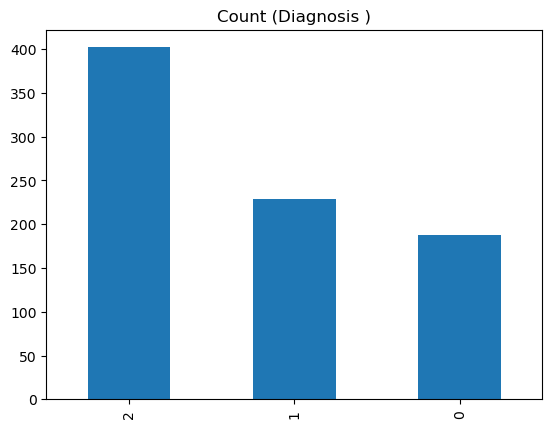

In [19]:
# Count number of samples per class

target_count = df_dropped_corr['Diagnosis '].value_counts()
print('Class 0 (Alzheimer\'s disease):', target_count[0])
print('Class 1 (Cognitively normal):', target_count[1])
print('Class 2 (Late mild cognitive impairment):', target_count[2])

# Plot result
df_dropped_corr['Diagnosis '].value_counts().plot(kind='bar', title='Count (Diagnosis )');

In [20]:
'''
    get stats for Positive (Alzheimer's disease) subject
'''
positive=df_dropped_corr[df_dropped_corr['Diagnosis ']==0].describe().T
positive.head(10)

,count,mean,std,min,25%,50%,75%,max
0,,,,,,,,
RID at enrollment (Participant roster ID),188.0,779.095745,412.062027,3.0,429.750,794.50,1138.75,1435.0
Age\n(year),188.0,75.258511,7.533482,55.1,70.775,75.65,81.35,90.9
Gender,188.0,0.526596,0.500625,0.0,0.000,1.00,1.00,1.0
Education,188.0,14.659574,3.138695,4.0,12.000,15.00,16.00,20.0
Ethnicity\ncategory,188.0,0.989362,0.178807,0.0,1.000,1.00,1.00,2.0
Race subcategory,188.0,3.872340,0.511557,1.0,4.000,4.00,4.00,4.0
Married\nstatus,188.0,1.303191,0.974866,0.0,1.000,1.00,1.00,4.0
APOE4 genotype result,188.0,0.851064,0.715862,0.0,0.000,1.00,1.00,2.0
Diagnosis,188.0,0.000000,0.000000,0.0,0.000,0.00,0.00,0.0


In [21]:
'''
    get stats for Negative (Cognitively normal) subjects
'''
negative=df_dropped_corr[df_dropped_corr['Diagnosis ']==1].describe().T
negative.head(10)

,count,mean,std,min,25%,50%,75%,max
0,,,,,,,,
RID at enrollment (Participant roster ID),229.0,578.139738,390.296061,2.0,232.0,534.0,898.0,1306.0
Age\n(year),229.0,75.869432,5.020330,59.9,72.3,75.6,78.5,89.6
Gender,229.0,0.519651,0.500708,0.0,0.0,1.0,1.0,1.0
Education,229.0,16.065502,2.856216,6.0,14.0,16.0,18.0,20.0
Ethnicity\ncategory,229.0,0.995633,0.114624,0.0,1.0,1.0,1.0,2.0
Race subcategory,229.0,3.820961,0.605745,1.0,4.0,4.0,4.0,4.0
Married\nstatus,229.0,1.524017,1.208736,0.0,1.0,1.0,1.0,4.0
APOE4 genotype result,229.0,0.288210,0.499904,0.0,0.0,0.0,1.0,2.0
Diagnosis,229.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0


In [22]:
# create dataframe
feat_means=pd.DataFrame({'negative':negative[:-1]['mean'], 'positive':positive[:-1]['mean']})

# calculate fold changes and add to dataframe
fc=(feat_means.positive - feat_means.negative)/feat_means.negative
feat_means['fc']=fc

# calculate Log2 of fold change and add to data frame
log2_fc=np.log2(np.abs(fc))
feat_means['log2_fc']=log2_fc
feat_means=feat_means.reset_index().rename(columns={'index':'feature'})

# sort dataframe according to fold change
feat_means['abs']=abs(feat_means['fc'])

# Sort by fold absolute change
feat_means=feat_means.sort_values(by=['abs'],ascending=False).drop(columns=['abs'])
feat_means.head(10)


,0,negative,positive,fc,log2_fc
284,UDP.GLUCURONIC.ACID,306.410480,937.398936,2.059291,1.042148
7,APOE4 genotype result,0.288210,0.851064,1.952934,0.965643
301,SALICYLIC.ACID,2291.209607,5975.494681,1.608009,0.685275
975,DEDE.18.2.,28.136566,57.087988,1.028961,0.041188
8,Diagnosis,1.000000,0.000000,-1.000000,0.000000
976,DEDE.20.4.,7.154077,14.097803,0.970597,-0.043056
406,ACETAMINOPHEN,482.323144,885.430851,0.835763,-0.258835
45,C-Reactive Protein (CRP) (ug/mL),1.850699,3.392979,0.833350,-0.263005
349,IBUPROFEN,656.751092,1091.159574,0.661451,-0.596294
233,CA,171.647598,69.833245,-0.593159,-0.753509


In [24]:
'''
    get stats for Positive (Mild cognitive impairment stage of Alzheimer's disease) subject
'''

positive=df_dropped_corr[df_dropped_corr['Diagnosis ']==2].describe().T
positive.head(10)

,count,mean,std,min,25%,50%,75%,max
0,,,,,,,,
RID at enrollment (Participant roster ID),402.0,761.624378,417.501469,4.0,398.000,796.00,1119.75,1427.0
Age\n(year),402.0,74.761443,7.359526,54.4,70.225,75.15,80.40,89.3
Gender,402.0,0.644279,0.479328,0.0,0.000,1.00,1.00,1.0
Education,402.0,15.649254,3.028355,4.0,14.000,16.00,18.00,20.0
Ethnicity\ncategory,402.0,0.975124,0.198192,0.0,1.000,1.00,1.00,2.0
Race subcategory,402.0,3.845771,0.608415,0.0,4.000,4.00,4.00,4.0
Married\nstatus,402.0,1.313433,1.028894,0.0,1.000,1.00,1.00,4.0
APOE4 genotype result,402.0,0.651741,0.679672,0.0,0.000,1.00,1.00,2.0
Diagnosis,402.0,2.000000,0.000000,2.0,2.000,2.00,2.00,2.0


### III. Box plot of single feature

<Axes: xlabel='Diagnosis ', ylabel='Age\n(year)'>

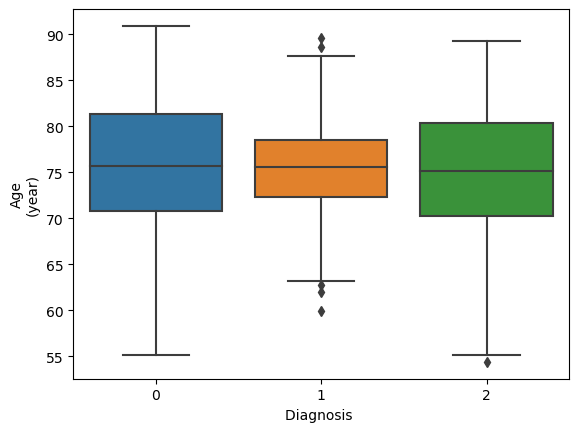

In [25]:
# Age
sns.boxplot(x = df_dropped_corr['Diagnosis '],y = df_dropped_corr[features[1]])
#ax = sns.swarmplot(x="index", y="worst_concave_points", data=dataset, color='#7d0013')

<Axes: xlabel='Diagnosis ', ylabel='Education'>

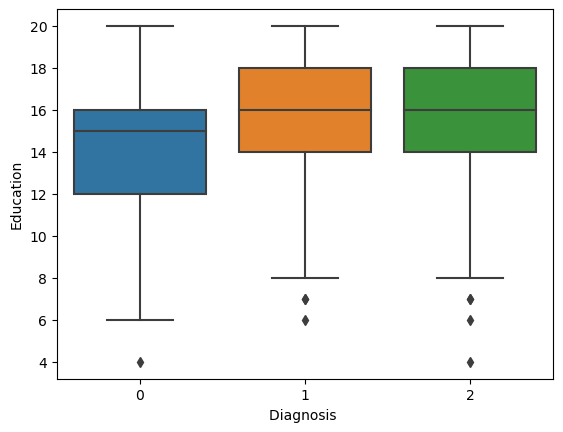

In [26]:
# Education
sns.boxplot(x = df_dropped_corr['Diagnosis '],y = df_dropped_corr['Education'])
#ax = sns.swarmplot(x="index", y="worst_concave_points", data=dataset, color='#7d0013')

<Axes: xlabel='Diagnosis ', ylabel='APOE4 genotype result'>

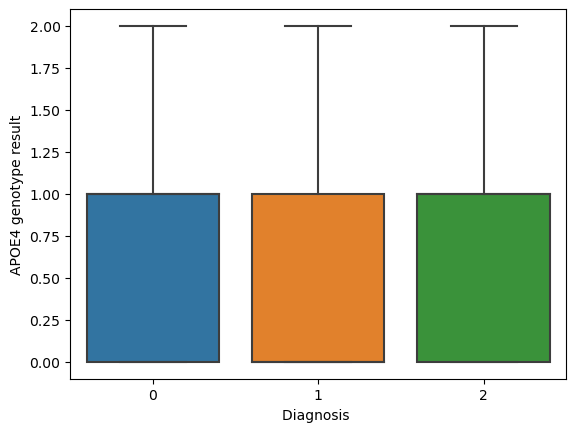

In [27]:
# ApoE
sns.boxplot(x = df_dropped_corr['Diagnosis '],y = df_dropped_corr['APOE4 genotype result'])
#ax = sns.swarmplot(x="index", y="worst_concave_points", data=dataset, color='#7d0013')

<Axes: xlabel='Diagnosis ', ylabel='Married\nstatus'>

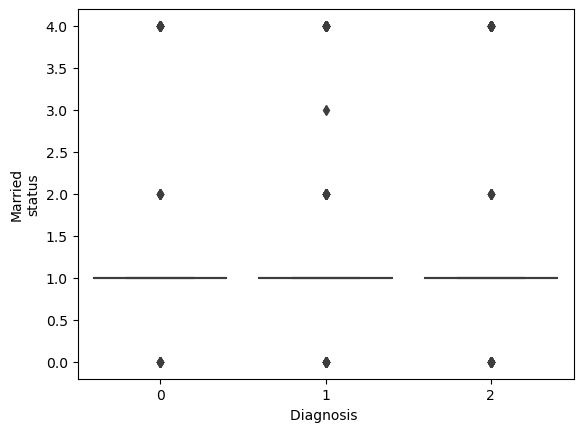

In [28]:
# Married\nstatus
sns.boxplot(x = df_dropped_corr['Diagnosis '],y = df_dropped_corr['Married\nstatus'])
#ax = sns.swarmplot(x="index", y="worst_concave_points", data=dataset, color='#7d0013')

# Step-4. Model Development, Validation and Model Evaluation

# 1. Data Splitting and Feature Scaling:
The data splitting and feature scaling task has already been performed.Validation and Test data has been scaled here.

In [29]:
# Scale the validation set using the same scaler
X_val_scaled = scaler.transform(X_val)

# Scale the test set using the same scaler
X_test_scaled = scaler.transform(X_test)

# a. Random Forest Classification model:

In [30]:
# Define the Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Define hyperparameters and their possible values for tuning
rf_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform hyperparameter tuning using GridSearchCV
rf_grid_search = GridSearchCV(estimator=rf_model, param_grid=rf_param_grid, cv=5)
rf_grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters
best_rf_params = rf_grid_search.best_params_

# Train the Random Forest model with the best hyperparameters
rf_best_model = RandomForestClassifier(random_state=42, **best_rf_params)
rf_best_model.fit(X_train_scaled, y_train)

RandomForestClassifier(random_state=42)

# b. Support Vector Machine (SVM)

In [31]:
# Define the SVM model
svm_model = SVC()

# Define hyperparameters and their possible values for tuning
svm_param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto', 0.1, 1]
}

# Perform hyperparameter tuning using GridSearchCV
svm_grid_search = GridSearchCV(estimator=svm_model, param_grid=svm_param_grid, cv=5)
svm_grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters
best_svm_params = svm_grid_search.best_params_

# Train the SVM model with the best hyperparameters
svm_best_model = SVC(**best_svm_params)
svm_best_model.fit(X_train_scaled, y_train)

SVC(C=1, kernel='linear')

# c. Logistic Regression:

In [32]:
# Define the Logistic Regression model
lr_model = LogisticRegression()

# Define hyperparameters and their possible values for tuning
lr_param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'solver': ['liblinear', 'lbfgs', 'saga'],
    'max_iter': [100, 200, 300, 1000]
}

# Perform hyperparameter tuning using GridSearchCV
lr_grid_search = GridSearchCV(estimator=lr_model, param_grid=lr_param_grid, cv=5)
lr_grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters
best_lr_params = lr_grid_search.best_params_

# Train the Logistic Regression model with the best hyperparameters
lr_best_model = LogisticRegression(**best_lr_params)
lr_best_model.fit(X_train_scaled, y_train)

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupad

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupad

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupad

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupad

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


LogisticRegression(C=0.1, max_iter=300, penalty='l1', solver='saga')

# Model Validation:

In [33]:
# Make predictions on the validation set
rf_val_predictions = rf_best_model.predict(X_val_scaled)
svm_val_predictions = svm_best_model.predict(X_val_scaled)
lr_val_predictions = lr_best_model.predict(X_val_scaled)

# Evaluate the models
rf_val_accuracy = accuracy_score(y_val, rf_val_predictions)
svm_val_accuracy = accuracy_score(y_val, svm_val_predictions)
lr_val_accuracy = accuracy_score(y_val, lr_val_predictions)

print("Validation Set Performance:")
print(f"Random Forest Accuracy: {rf_val_accuracy:.2f}")
print(f"SVM Accuracy: {svm_val_accuracy:.2f}")
print(f"Logistic Regression Accuracy: {lr_val_accuracy:.2f}")

# You can also print classification reports for more detailed evaluation
print("Random Forest Classification Report:")
print(classification_report(y_val, rf_val_predictions))

print("SVM Classification Report:")
print(classification_report(y_val, svm_val_predictions))

print("Logistic Regression Classification Report:")
print(classification_report(y_val, lr_val_predictions))

Validation Set Performance:
Random Forest Accuracy: 0.75
SVM Accuracy: 0.60
Logistic Regression Accuracy: 0.69
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.11      0.20        37
           1       0.73      0.82      0.77        45
           2       0.75      0.98      0.85        90

    accuracy                           0.75       172
   macro avg       0.83      0.64      0.61       172
weighted avg       0.80      0.75      0.69       172

SVM Classification Report:
              precision    recall  f1-score   support

           0       0.40      0.59      0.48        37
           1       0.55      0.53      0.54        45
           2       0.78      0.63      0.70        90

    accuracy                           0.60       172
   macro avg       0.58      0.59      0.57       172
weighted avg       0.64      0.60      0.61       172

Logistic Regression Classification Report:
              precis

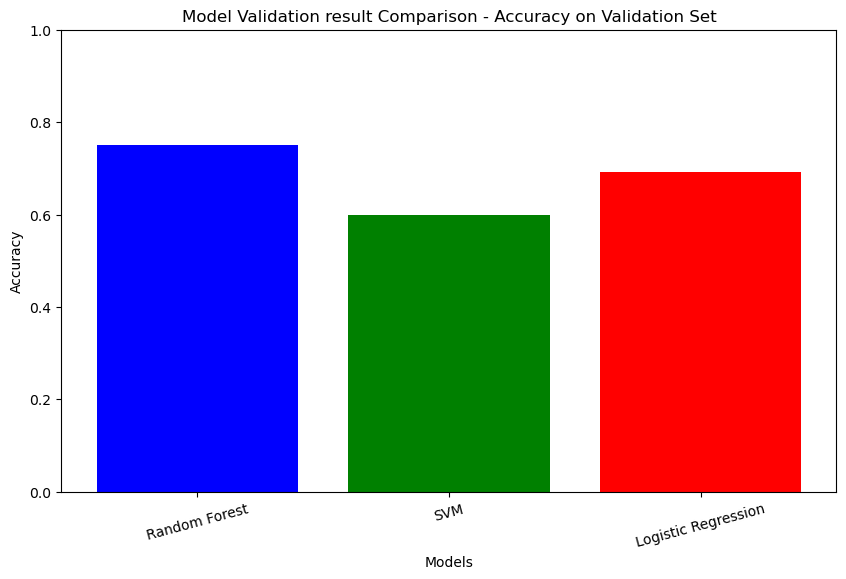

In [34]:
# Define model names and their respective performance metrics
model_names = ['Random Forest', 'SVM', 'Logistic Regression']
accuracies = [rf_val_accuracy, svm_val_accuracy, lr_val_accuracy]

# Create a bar plot for accuracy comparison
plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red'])
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Validation result Comparison - Accuracy on Validation Set')
plt.ylim([0.0, 1.0])  # Set the y-axis range from 0 to 1 for accuracy
plt.xticks(rotation=15)  # Rotate x-axis labels for readability
plt.show()

# Model Evaluation:

# Random Forest Model Evaluation

In [35]:
# Make predictions on the test set
rf_test_predictions = rf_best_model.predict(X_test_scaled)

# Evaluate the Random Forest model on the test set
rf_test_accuracy = accuracy_score(y_test, rf_test_predictions)
rf_test_classification_report = classification_report(y_test, rf_test_predictions)
rf_confusion_matrix = confusion_matrix(y_test, rf_test_predictions)

print("Test Set Performance (Random Forest Model):")
print(f"Accuracy: {rf_test_accuracy:.2f}")
print("Classification Report:")
print(rf_test_classification_report)
print("Confusion Matrix:")
print(rf_confusion_matrix)

Test Set Performance (Random Forest Model):
Accuracy: 0.65
Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.14      0.23        21
           1       0.67      0.67      0.67        21
           2       0.65      0.97      0.78        32

    accuracy                           0.65        74
   macro avg       0.64      0.59      0.56        74
weighted avg       0.64      0.65      0.59        74

Confusion Matrix:
[[ 3  7 11]
 [ 1 14  6]
 [ 1  0 31]]


# Support Vector Classifier Model Evaluation

In [36]:
# Make predictions on the test set
svm_test_predictions = svm_best_model.predict(X_test_scaled)

# Evaluate the Random Forest model on the test set
svm_test_accuracy = accuracy_score(y_test, svm_test_predictions)
svm_test_classification_report = classification_report(y_test, svm_test_predictions)
svm_confusion_matrix = confusion_matrix(y_test, svm_test_predictions)

print("Test Set Performance (Support vector Model):")
print(f"Accuracy: {svm_test_accuracy:.2f}")
print("Classification Report:")
print(svm_test_classification_report)
print("Confusion Matrix:")
print(svm_confusion_matrix)

Test Set Performance (Support vector Model):
Accuracy: 0.62
Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.67      0.60        21
           1       0.61      0.52      0.56        21
           2       0.70      0.66      0.68        32

    accuracy                           0.62        74
   macro avg       0.62      0.62      0.61        74
weighted avg       0.63      0.62      0.62        74

Confusion Matrix:
[[14  3  4]
 [ 5 11  5]
 [ 7  4 21]]


# Logistic regression Model Evaluation:

In [37]:
# Make predictions on the test set
lr_test_predictions = lr_best_model.predict(X_test_scaled)

# Evaluate the Random Forest model on the test set
lr_test_accuracy = accuracy_score(y_test, lr_test_predictions)
lr_test_classification_report = classification_report(y_test, lr_test_predictions)
lr_confusion_matrix = confusion_matrix(y_test, lr_test_predictions)

print("Test Set Performance (Logistic regression Model):")
print(f"Accuracy: {lr_test_accuracy:.2f}")
print("Classification Report:")
print(lr_test_classification_report)
print("Confusion Matrix:")
print(lr_confusion_matrix)

Test Set Performance (Logistic regression Model):
Accuracy: 0.72
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.48      0.61        21
           1       0.68      0.71      0.70        21
           2       0.70      0.88      0.78        32

    accuracy                           0.72        74
   macro avg       0.74      0.69      0.69        74
weighted avg       0.73      0.72      0.71        74

Confusion Matrix:
[[10  4  7]
 [ 1 15  5]
 [ 1  3 28]]


# 5. Model Development using ranked Features (with Spearmann correlation), Validation and Evaluation

# Calculate the Spearman correlation matrix:

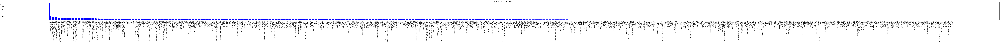

In [38]:
# Calculate the Spearman correlation matrix
correlation_mat = df_dropped_corr.corr(method='spearman')

# Extract the correlation values of each feature with the target variable (assuming the target variable is named 'target')
correlation_with_target = correlation_mat['Diagnosis ']

# Create a DataFrame to store the absolute correlation values and rank the features
ranked = pd.DataFrame({'Feature': correlation_with_target.index, 'Correlation': correlation_with_target.abs()})

# Sort the DataFrame by the absolute correlation values in descending order
ranked = ranked.sort_values(by='Correlation', ascending=False)

# Plot the ranked features
plt.figure(figsize=(180, 8))
plt.bar(ranked['Feature'], ranked['Correlation'], color='blue')
plt.xticks(rotation='vertical', fontsize=11)
plt.yticks(fontsize=14)
plt.xlabel('')
plt.ylabel('Spearman Ranked Correlation', fontsize=14)
plt.title('Features Ranked by Correlation', fontsize=16)
plt.tight_layout()
plt.show()

In [40]:
#Print ranked features

ranked[:-1]

,Feature,Correlation
0,,
Diagnosis,Diagnosis,1.000000
Complement C3 (C3) (mg/mL),Complement C3 (C3) (mg/mL),0.249975
Pulmonary and Activation-Regulated Chemo (ng/mL),Pulmonary and Activation-Regulated Chemo (ng/mL),0.175743
Alpha-1-Antitrypsin (AAT) (mg/mL),Alpha-1-Antitrypsin (AAT) (mg/mL),0.175408
Apolipoprotein H (Apo H) (ug/mL),Apolipoprotein H (Apo H) (ug/mL),0.172919
...,...,...
GLYCOLIC.ACID,GLYCOLIC.ACID,0.000268
Ferritin (FRTN) (ng/mL),Ferritin (FRTN) (ng/mL),0.000115
TCDCA,TCDCA,0.000099


In [42]:
# Calculate the correlation matrix
corr = df_dropped_corr.drop(columns=['Diagnosis ']).corr(method='spearman')

# Define a custom color palette (replace with your desired colors)
custom_palette = sns.color_palette("coolwarm", as_cmap=True)

# Create a clustered heatmap with customized color settings
sns.clustermap(
    corr,
    cmap=custom_palette,
    figsize=(100, 100),
    method='average',  # You can adjust the clustering method
    linewidths=0.1,    # Add some separation between cells
    vmin=-1, vmax=1,   # Set the color scale limits for correlation values
    center=0,          # Center the color scale at zero correlation
)

plt.show()

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


In [47]:
print(top_corr_features.index)

MultiIndex([(                         'INDOLE.3.LACTATE', ...),
            (                          'LPC.20.5...SN1.', ...),
            (                       'TG.52.1...NL.18.0.', ...),
            (                          'LPC.22.4...SN2.', ...),
            (                           'TG.50.0...SIM.', ...),
            (                       'TG.54.1...NL.18.1.', ...),
            (                       'TG.52.1...NL.18.0.', ...),
            (                       'TG.48.2...NL.14.0.', ...),
            (                       'TG.52.1...NL.18.1.', ...),
            (                          'LPC.14.0...SN1.', ...),
            (                          'LPC.22.6...SN2.', ...),
            (                       'TG.50.1...NL.16.0.', ...),
            (                          'LPC.15.0...SN2.', ...),
            (                           'TG.50.3...SIM.', ...),
            (            'LPC.18.3...A...SN1...104_SN1.', ...),
            (                          '

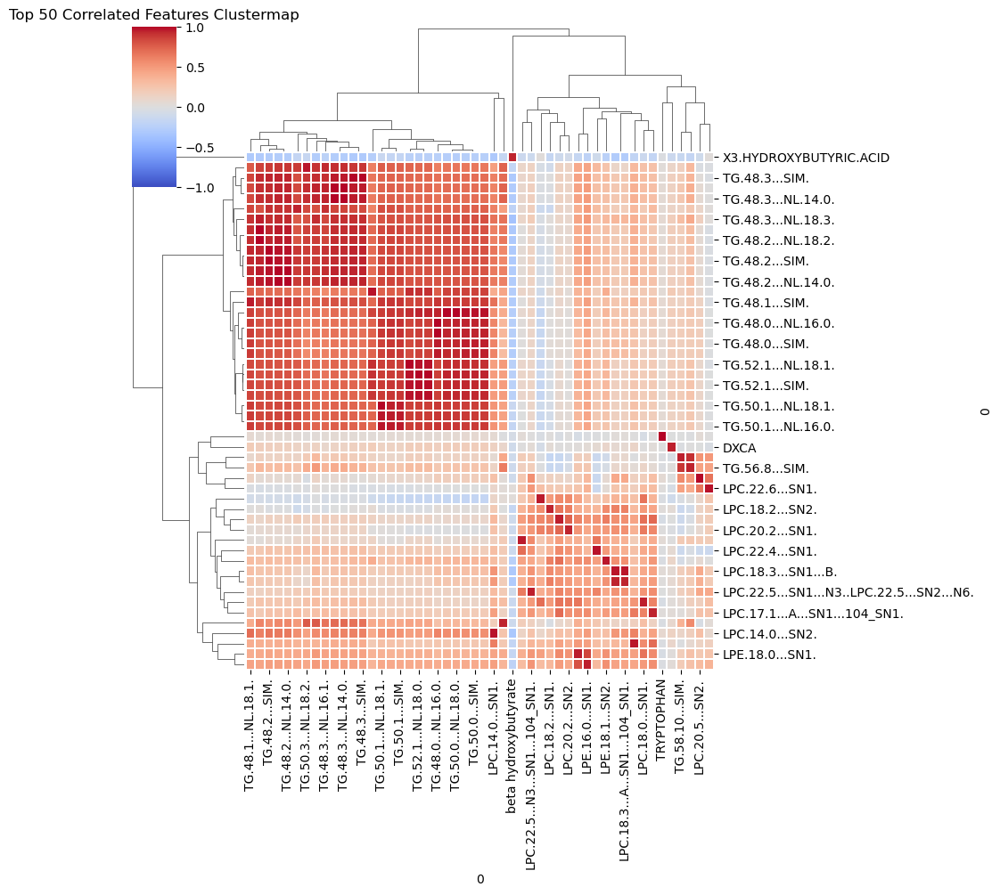

In [57]:
# Calculate the correlation matrix
corr = df_dropped_corr.drop(columns=['Diagnosis ']).corr(method='spearman')

# Extract the top correlated feature pairs
top_corr_features = (corr
                     .unstack()
                     .sort_values(ascending=False)
                     .drop_duplicates()
                     .iloc[1:51])  # Exclude the highest correlation with itself

# Extract the corresponding correlation matrix using the MultiIndex
top_corr_matrix = corr.loc[top_corr_features.index.get_level_values(0), top_corr_features.index.get_level_values(1)]

# Define a custom color palette (replace with your desired colors)
custom_palette = sns.color_palette("coolwarm", as_cmap=True)

# Create a clustered heatmap with customized color settings
sns.clustermap(
    top_corr_matrix,
    cmap=custom_palette,
    figsize=(10, 10),  # Adjust the figure size as needed
    method='average',  # You can adjust the clustering method
    linewidths=0.1,    # Add some separation between cells
    vmin=-1, vmax=1,   # Set the color scale limits for correlation values
    center=0,          # Center the color scale at zero correlation
)
plt.title('Top 50 Correlated Features Clustermap')
plt.show()

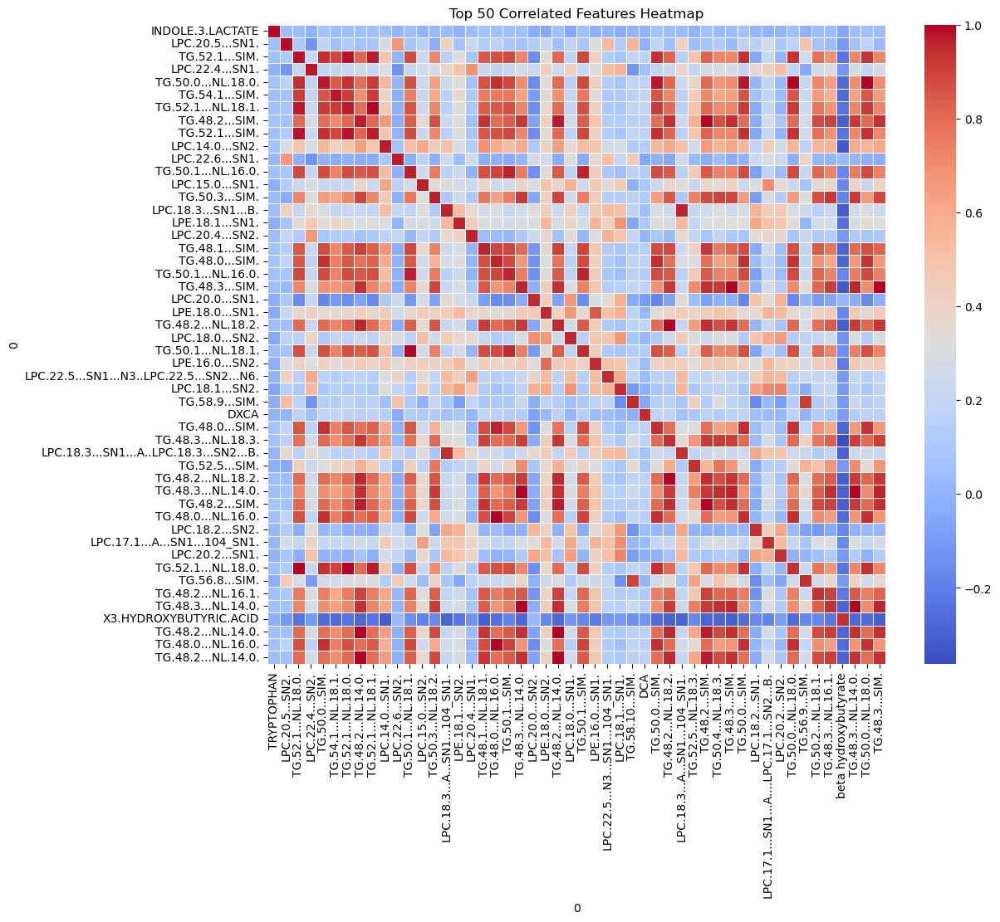

In [56]:
# Calculate the correlation matrix
corr = df_dropped_corr.drop(columns=['Diagnosis ']).corr(method='spearman')

# Get the top 50 correlated feature pairs (excluding self-correlation)
top_corr_features = (corr
                     .unstack()
                     .sort_values(ascending=False)
                     .drop_duplicates()
                     .iloc[1:51])  # Exclude the highest correlation with itself

# Extract the corresponding correlation matrix
top_corr_matrix = corr.loc[top_corr_features.index.get_level_values(0), top_corr_features.index.get_level_values(1)]

# Create a heatmap of the top 50 correlated features
plt.figure(figsize=(12, 10))
sns.heatmap(top_corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Top 50 Correlated Features Heatmap')
plt.show()

In [58]:
# Assuming you have a DataFrame 'ranked' with ranked features and a target variable 'target'
# Select the top 'k' features based on their Spearman correlation values
k = 50
selected_features = ranked['Feature'].iloc[:k].tolist()

# Exclude the target variable from the selected features
if 'Diagnosis ' in selected_features:
    selected_features.remove('Diagnosis ')

# Create a new feature matrix containing only the selected features from the original unscaled DataFrame
X_train_selected = X_train[selected_features]
X_val_selected = X_val[selected_features]
X_test_selected = X_test[selected_features]

# Random Forest Classifier with Spearmann ranked features

In [59]:
# 1. Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Define hyperparameters and their possible values for tuning
rf_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform hyperparameter tuning using GridSearchCV
rf_grid_search = GridSearchCV(estimator=rf_model, param_grid=rf_param_grid, cv=5)
rf_grid_search.fit(X_train_selected, y_train)

# Get the best hyperparameters
best_rf_params = rf_grid_search.best_params_

# Train the Random Forest model with the best hyperparameters
rf_best_model = RandomForestClassifier(random_state=42, **best_rf_params)
rf_best_model.fit(X_train_selected, y_train)

# Make predictions on the validation set
rf_val_predictions = rf_best_model.predict(X_val_selected)

# Evaluate the Random Forest model on the validation set
rf_val_accuracy = accuracy_score(y_val, rf_val_predictions)
rf_val_classification_report = classification_report(y_val, rf_val_predictions)
rf_val_confusion_matrix = confusion_matrix(y_val, rf_val_predictions)

print("Random Forest Model (Validation Set):")
print(f"Best Hyperparameters: {best_rf_params}")
print(f"Accuracy: {rf_val_accuracy:.2f}")
print("Classification Report:")
print(rf_val_classification_report)
print("Confusion Matrix:")
print(rf_val_confusion_matrix)

Random Forest Model (Validation Set):
Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Accuracy: 0.80
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.30      0.45        37
           1       0.78      0.84      0.81        45
           2       0.79      0.98      0.88        90

    accuracy                           0.80       172
   macro avg       0.83      0.71      0.71       172
weighted avg       0.81      0.80      0.77       172

Confusion Matrix:
[[11  9 17]
 [ 1 38  6]
 [ 0  2 88]]


# Evaluation of Random Forest Classifier Model with Spearmann ranked feature

In [60]:
# Evaluate the model on the test set

# 1. Random Forest Classifier
rf_test_predictions = rf_best_model.predict(X_test_selected)

rf_test_accuracy = accuracy_score(y_test, rf_test_predictions)
rf_test_classification_report = classification_report(y_test, rf_test_predictions)
rf_test_confusion_matrix = confusion_matrix(y_test, rf_test_predictions)

print("Random Forest Model (Test Set):")
print(f"Accuracy: {rf_test_accuracy:.2f}")
print("Classification Report:")
print(rf_test_classification_report)
print("Confusion Matrix:")
print(rf_test_confusion_matrix)

Random Forest Model (Test Set):
Accuracy: 0.73
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.43      0.56        21
           1       0.74      0.67      0.70        21
           2       0.70      0.97      0.82        32

    accuracy                           0.73        74
   macro avg       0.75      0.69      0.69        74
weighted avg       0.75      0.73      0.71        74

Confusion Matrix:
[[ 9  4  8]
 [ 2 14  5]
 [ 0  1 31]]


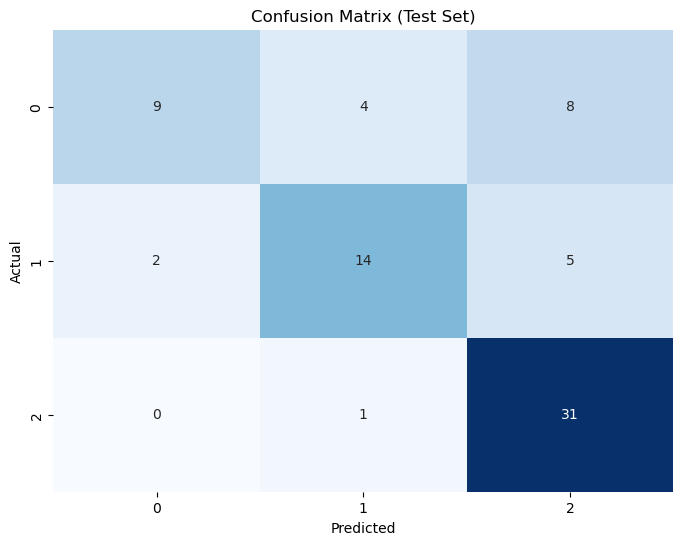

In [61]:
#Confusion Matrix Visualization:
#A heatmap of the confusion matrix to visualize the number of true positives, true negatives, false positives & false negatives.


plt.figure(figsize=(8, 6))
sns.heatmap(rf_test_confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Test Set)')
plt.show()

# 6. Model Development using p-value feature ranking, Validation and Evaluation:

In [63]:
'''
1. calculate the mean for each feature for Negative samples ('1')
'''
negative_stats=df_dropped_corr[df_dropped_corr['Diagnosis ']==1].describe().T # stats
negative_stats=negative_stats[:-1] # drop last row -- which is the class label stats
negative_means=negative_stats['mean']
negative_means

0
RID at enrollment (Participant roster ID)    578.139738
Age\n(year)                                   75.869432
Gender                                         0.519651
Education                                     16.065502
Ethnicity\ncategory                            0.995633
                                                ...    
Glycine                                      558.196412
Inosine                                        0.768560
Hypoxanthine                                   0.620117
Xanthine                                       0.701106
Xanthosine                                     0.026241
Name: mean, Length: 1224, dtype: float64

In [64]:
'''
2. calculate the mean for each feature for Positive samples ('0')
'''
positive_stats=df_dropped_corr[df_dropped_corr['Diagnosis ']==0].describe().T # stats
positive_stats=positive_stats[:-1] # drop last row -- which is the class label stats
positive_means=positive_stats['mean']
positive_means

0
RID at enrollment (Participant roster ID)    779.095745
Age\n(year)                                   75.258511
Gender                                         0.526596
Education                                     14.659574
Ethnicity\ncategory                            0.989362
                                                ...    
Glycine                                      479.292568
Inosine                                        0.762608
Hypoxanthine                                   0.598683
Xanthine                                       0.679132
Xanthosine                                     0.028084
Name: mean, Length: 1224, dtype: float64

In [65]:
'''
3. compare means for Positive and Negative samples
'''

# create empty dataframe
feat_means=pd.DataFrame()

# add a column named 'features'
feat_means['features']=negative_stats.index

# add a column for 'neg_means'
feat_means['neg_means']=negative_means.values

# add a column for 'neg_means'
feat_means['pos_means']=positive_means.values

# calculate % fold change between positive and negative
fc=((feat_means['pos_means'] - feat_means['neg_means'])/feat_means['neg_means'])*100

# add fold change column
feat_means['fold_change']=fc
feat_means

,features,neg_means,pos_means,fold_change
0,RID at enrollment (Participant roster ID),578.139738,779.095745,34.759072
1,Age\n(year),75.869432,75.258511,-0.805228
2,Gender,0.519651,0.526596,1.336492
3,Education,16.065502,14.659574,-8.751222
4,Ethnicity\ncategory,0.995633,0.989362,-0.629899
...,...,...,...,...
1219,Glycine,558.196412,479.292568,-14.135498
1220,Inosine,0.768560,0.762608,-0.774397
1221,Hypoxanthine,0.620117,0.598683,-3.456357
1222,Xanthine,0.701106,0.679132,-3.134247


In [67]:
'''
4. Calculate pvalue and Rank features according to p-value
'''
from scipy import stats

# import plotting library
from matplotlib import pyplot as plt

# copy data
dataset=df_dropped_corr

# seperate the two sets of data
a=dataset[dataset['Diagnosis ']==0].drop(columns=['Diagnosis '])
b=dataset[dataset['Diagnosis ']==1].drop(columns=['Diagnosis '])

# Calculate pvalues using t-test
pvals=(pd.DataFrame(stats.ttest_ind(a,b)).T).drop(columns=[0]).rename(columns={1: "p_value"})

pvals

# create a dataframe
ranked_pvals=pd.DataFrame()

# add features column
ranked_pvals['feature'] = negative_stats.index

# add pvalue
ranked_pvals['p_value'] = pvals['p_value']

# rank dataframe by pvalue
ranked_pvals=ranked_pvals.sort_values(by=['p_value'])

ranked_pvals

,feature,p_value
7,APOE4 genotype result,3.062916e-19
974,DE.22.6.,1.434769e-14
975,DEDE.18.2.,3.259431e-12
16,Total Plasma Homocysteine,2.131033e-11
0,RID at enrollment (Participant roster ID),5.137216e-07
...,...,...
698,LPC.14.0...SN1.,9.973010e-01
730,LPC.19.1...C.,9.979182e-01
308,PSEUDO.URIDINE,9.985520e-01
1062,DG.18.2_18.2.,9.990323e-01


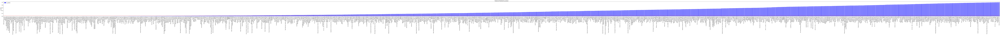

In [68]:
# plot ranking

ranked_pvals.plot.bar(x='feature', y='p_value', rot=0,figsize=(220,8), color='blue')

plt.xticks(rotation='vertical',fontsize=11)
plt.yticks(fontsize=14)
plt.xlabel('')
plt.ylabel('p_value',fontsize=14)
plt.legend(fontsize=14)
plt.title('Features Ranked by pvalue',fontsize=16)
plt.axhline(y = 0.05, color = 'r', linestyle = '--')
plt.tight_layout()


In [69]:
'''
identify significant features
'''
significant_features = ranked_pvals[ranked_pvals.p_value <= 0.05]
significant_features.feature

7                            APOE4 genotype result
974                                       DE.22.6.
975                                     DEDE.18.2.
16                       Total Plasma Homocysteine
0        RID at enrollment (Participant roster ID)
                           ...                    
834                            PE.P.16.0.20.3...B.
821                                PE.O.18.1.22.6.
1007                                      AC.14.0.
482                                CER.M18.0.23.0.
101     Matrix Metalloproteinase-1 (MMP-1) (ng/ml)
Name: feature, Length: 292, dtype: object

In [70]:
# Extract the significant feature names from the DataFrame
significant_feature_names = significant_features['feature'].tolist()

# Create a Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Fit the model on the training data with significant features
rf_model.fit(X_train[significant_feature_names], y_train)

# Hyperparameter tuning 
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30]
}

grid_search = GridSearchCV(rf_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train[significant_feature_names], y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Use the best hyperparameters for the final model
best_rf_model = grid_search.best_estimator_

# Predictions on the validation set
val_predictions = best_rf_model.predict(X_val[significant_feature_names])

Best Hyperparameters: {'max_depth': 20, 'n_estimators': 100}


In [71]:
# Evaluate the model on the validation set
val_accuracy = accuracy_score(y_val, val_predictions)
val_classification_report = classification_report(y_val, val_predictions)
val_confusion_matrix = confusion_matrix(y_val, val_predictions)

# Print evaluation metrics for the validation set
print("Validation Accuracy:", val_accuracy)
print("Classification Report:")
print(val_classification_report)
print("Confusion Matrix:")
print(val_confusion_matrix)

Validation Accuracy: 0.7558139534883721
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.16      0.27        37
           1       0.73      0.80      0.77        45
           2       0.77      0.98      0.86        90

    accuracy                           0.76       172
   macro avg       0.75      0.65      0.63       172
weighted avg       0.75      0.76      0.71       172

Confusion Matrix:
[[ 6 11 20]
 [ 2 36  7]
 [ 0  2 88]]


In [72]:
# Predictions on the test set
test_predictions = best_rf_model.predict(X_test[significant_feature_names])

# Evaluate the model on the test set
test_accuracy = accuracy_score(y_test, test_predictions)
test_classification_report = classification_report(y_test, test_predictions)
test_confusion_matrix = confusion_matrix(y_test, test_predictions)

# Print evaluation metrics for the test set
print("Test Accuracy:", test_accuracy)
print("Test Classification Report:")
print(test_classification_report)
print("Test Confusion Matrix:")
print(test_confusion_matrix)

Test Accuracy: 0.6486486486486487
Test Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.14      0.22        21
           1       0.67      0.67      0.67        21
           2       0.66      0.97      0.78        32

    accuracy                           0.65        74
   macro avg       0.61      0.59      0.56        74
weighted avg       0.62      0.65      0.59        74

Test Confusion Matrix:
[[ 3  7 11]
 [ 2 14  5]
 [ 1  0 31]]


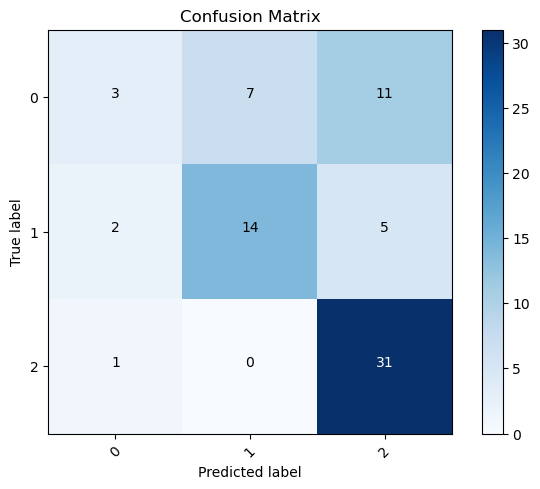

In [74]:
# Confusion Matrix

import itertools

confusion_m = confusion_matrix(y_test, test_predictions)

plt.figure()
plt.imshow(confusion_m, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
classes = np.unique(y_test)
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

fmt = 'd'
thresh = confusion_m.max() / 2.
for i, j in itertools.product(range(confusion_m.shape[0]), range(confusion_m.shape[1])):
    plt.text(j, i, format(confusion_m[i, j], fmt),
             horizontalalignment="center",
             color="white" if confusion_m[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

# 8. Model Development using Lasso regression feature selection and Method Validation and Model Evaluation:

In [75]:
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestRegressor

# Assuming 'X_train_scaled', 'X_val_scaled', 'X_test_scaled', 'y_train', 'y_val', 'y_test' are already defined

# Step 1: Feature Selection using Lasso Regression


# Perform feature selection using LassoCV
lasso = LassoCV(alphas=np.logspace(-4, 4, 100), cv=5)
lasso.fit(X_train_scaled, y_train)

# Get the selected feature indices
selected_feature_indices = np.where(lasso.coef_ != 0)[0]

# Select the features
X_train_selected = X_train_scaled[:, selected_feature_indices]
X_test_selected = X_test_scaled[:, selected_feature_indices]

# Train a Random Forest model on the selected features
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_selected, y_train)

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.101e-02, tolerance: 2.880e-02
  model = cd_fast.enet_coordinate_descent(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.863e-02, tolerance: 2.880e-02
  model = cd_fast.enet_coordinate_descent(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.733e-01, tolerance: 3.021e-02
  model = cd_fast.enet_coordinate_descent(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.429e-01, tolerance: 3.021e-02
  model = cd_fast.enet_coordinate_descent(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.779e-02, tolerance: 2.976e-02
  model = cd_fast.enet_coordinate_descent(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.526e-02, tolerance: 2.976e-02
  model = cd_fast.enet_coordinate_descent(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.831e-02, tolerance: 3.019e-02
  model = cd_fast.enet_coordinate_descent(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.905e-02, tolerance: 3.019e-02
  model = cd_fast.enet_coordinate_descent(
C:\Users\nmupadhyay\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

RandomForestRegressor(random_state=42)

In [79]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

# Define hyperparameters for Random Forest and perform GridSearchCV


param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_classifier = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(rf_classifier, param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train_selected, y_train)

# Get the best Random Forest model
best_rf_classifier = grid_search.best_estimator_

# Make predictions
y_pred = best_rf_classifier.predict(X_test_selected)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, best_rf_classifier.predict_proba(X_test_selected), multi_class='ovr')
lasso_classification_report = classification_report(y_test, y_pred)

confusion = confusion_matrix(y_test, y_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC:", roc_auc)
print("Confusion Matrix:\n", confusion)
print("Classification report", lasso_classification_report)

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Accuracy: 0.6486486486486487
Precision: 0.740427927927928
Recall: 0.6486486486486487
F1 Score: 0.5736780258519389
ROC AUC: 0.8586683887391434
Confusion Matrix:
 [[ 2  8 11]
 [ 0 15  6]
 [ 0  1 31]]
Classification report               precision    recall  f1-score   support

           0       1.00      0.10      0.17        21
           1       0.62      0.71      0.67        21
           2       0.65      0.97      0.78        32

    accuracy                           0.65        74
   macro avg       0.76      0.59      0.54        74
weighted avg       0.74      0.65      0.57        74

Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50}


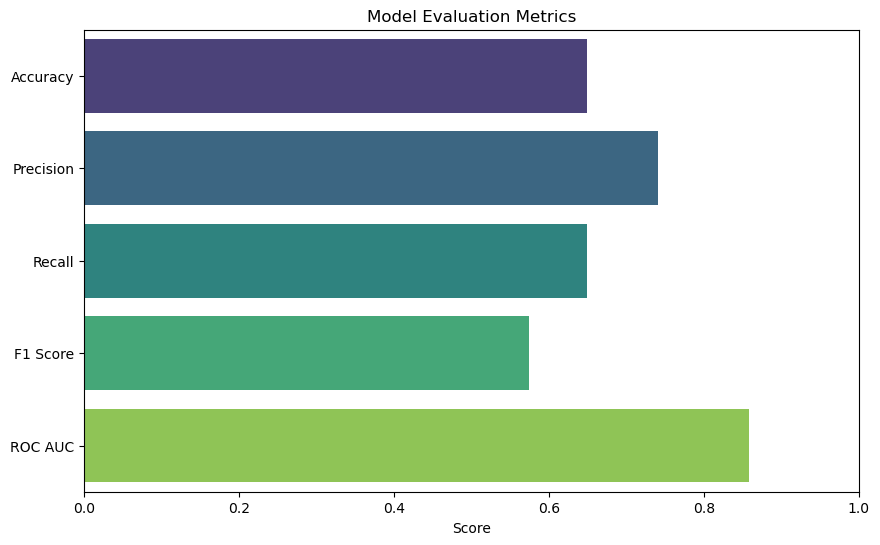

In [80]:
# Create a bar plot for evaluation metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC']
values = [accuracy, precision, recall, f1, roc_auc]

plt.figure(figsize=(10, 6))
sns.barplot(x=values, y=metrics, palette='viridis')
plt.xlabel('Score')
plt.title('Model Evaluation Metrics')
plt.xlim(0, 1.0)  # Set the x-axis limit to be between 0 and 1 for scores
plt.show()

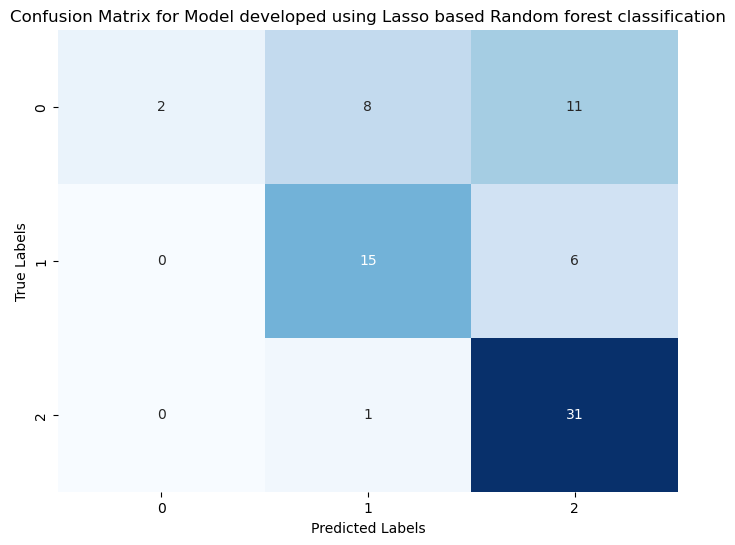

In [81]:
# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Model developed using Lasso based Random forest classification')
plt.show()

In [ ]:
#THE END